In [1]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory


import os

In [2]:
import os
import shutil
os.makedirs('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\outputs')
os.makedirs('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\processing')

In [3]:
dataset_images =  os.listdir("C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\inputs")

In [4]:
dataset_images[0]

'ISIC_0000019.jpg'

In [5]:
for i in range(len(dataset_images)):
    fname = dataset_images[i]
    src = os.path.join('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\inputs', fname)
    # destination path to image
    dst = os.path.join('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\processing',fname)
    # copy the image from the source to the destination
    shutil.copyfile(src, dst)

In [6]:
import glob
os.chdir('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\inputs')
img_processing = (glob.glob('*.jpg'))

In [7]:
img_processing[0]

'ISIC_0000019.jpg'

In [8]:
for i in range(len(img_processing)):
    fname = img_processing[i]
    src = os.path.join('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\inputs', fname)
    # destination path to image
    dst = os.path.join('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\processing',fname)
    # copy the image from the source to the destination
    shutil.copyfile(src, dst)

In [9]:
processed_img = os.listdir('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\processing')
len(processed_img)

150

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
i = 0
kernel = cv2.getStructuringElement(1,(17,17)) # Kernel for the morphological filtering

Bottom Hat Filtering


<ipython-input-11-f23135855f25>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


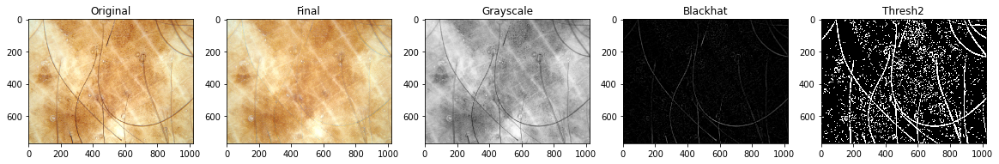

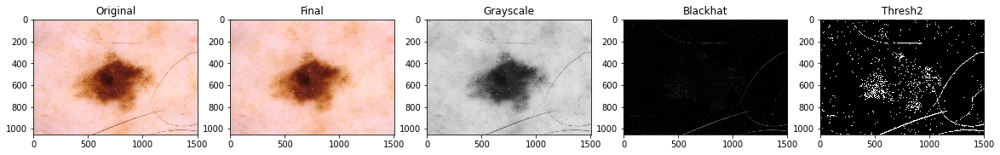

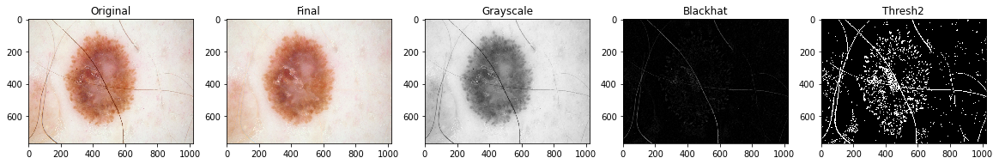

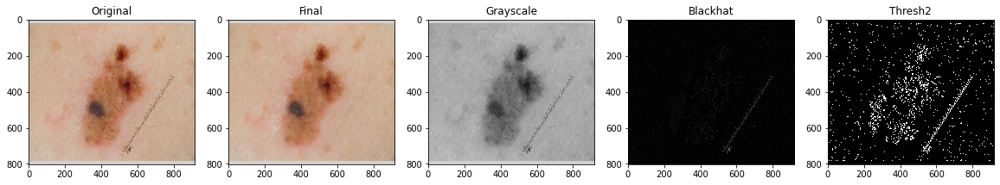

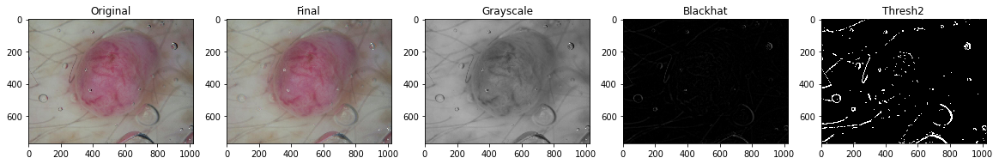

...

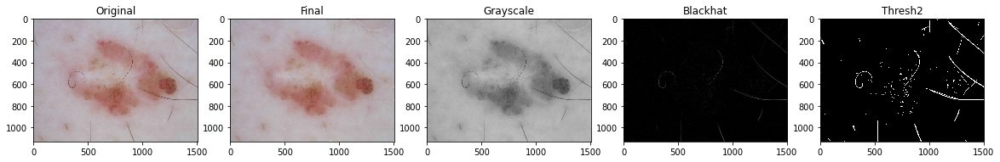

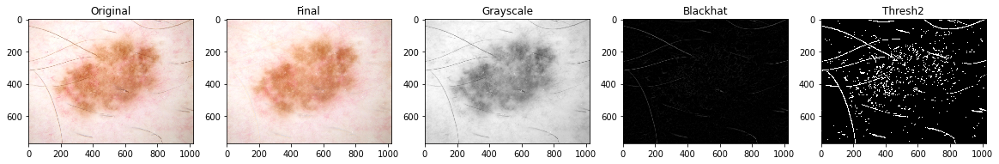

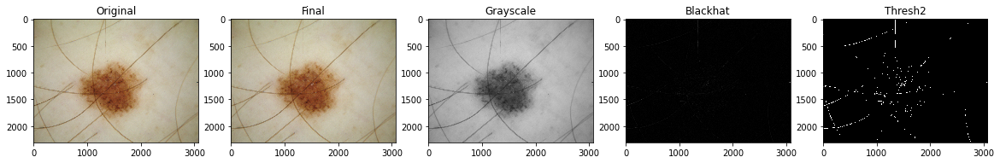

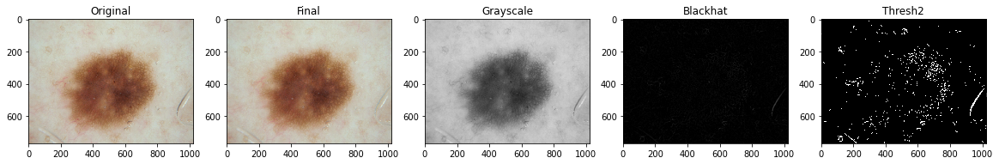

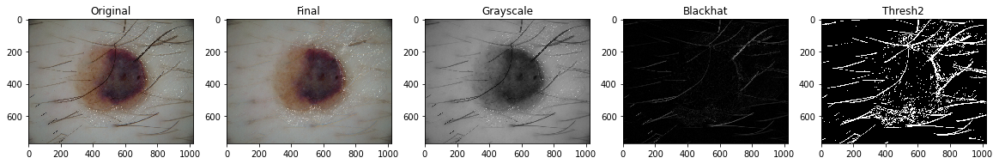

In [11]:
print("Bottom Hat Filtering")
for i in range(50):
  
  idx=np.random.randint(1,len(processed_img))
  src = cv2.imread(os.path.join('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\processing', processed_img[idx]))
  #print(src.shape)
  grayScale = cv2.cvtColor( src, cv2.COLOR_RGB2GRAY ) #1 Convert the original image to grayscale
  blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel) #2 Perform the blackHat filtering on the grayscale image to find the hair countours
  ret,thresh2 = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY) # intensify the hair countours in preparation for the inpainting algorithm
  dst = cv2.inpaint(src,thresh2,1,cv2.INPAINT_TELEA)# inpaint the original image depending on the mask
  

  cv2.imwrite('C:\\Users\\91702\\Downloads\\SDG- GR No.-16- Hair Segmentation and Removal from Dermoscopic Images\\DATASET\\Testing\\Rait\\outputs\\' + processed_img[idx], dst, [int(cv2.IMWRITE_JPEG_QUALITY), 100])
  plt.figure(figsize=(20,10))
  plt.subplot(1,5,1).set_title('Original')
  plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB), interpolation='nearest')
  plt.subplot(1,5,3).set_title('Grayscale')
  plt.imshow(cv2.cvtColor(grayScale, cv2.COLOR_BGR2RGB), interpolation='nearest')
  plt.subplot(1,5,4).set_title('Blackhat')
  plt.imshow(cv2.cvtColor(blackhat, cv2.COLOR_BGR2RGB), interpolation='nearest')
  plt.subplot(1,5,5).set_title('Thresh2')
  plt.imshow(cv2.cvtColor(thresh2, cv2.COLOR_BGR2RGB), interpolation='nearest')
  plt.subplot(1,5,2).set_title('Final')
  plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB), interpolation='nearest')

